#Start

In [30]:
#Dependencies
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split

from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import GridSearchCV

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report


In [31]:
# remove the warnings
import warnings                              
warnings .simplefilter('ignore') 

In [32]:
#Reading the csv file
df = pd.read_csv('FloodPredict(unclean).csv')
df.head()

,Unnamed: 0,Unnamed: 0.1,Sl,Station_Names,Year,Month,Max_Temp,Min_Temp,Rainfall,Relative_Humidity,...,Cloud_Coverage,Bright_Sunshine,Station_Number,X_COR,Y_COR,LATITUDE,LONGITUDE,ALT,Period,Flood?
0,0,0,0,Assam,1949,1,29.4,12.3,0.0,68.0,...,0.6,7.831915,41950,536809.8,510151.9,22.7,90.36,4,1949.01,NaN
1,1,1,1,Assam,1949,2,33.9,15.2,9.0,63.0,...,0.9,8.314894,41950,536809.8,510151.9,22.7,90.36,4,1949.02,NaN
2,2,2,2,Assam,1949,3,36.7,20.2,8.0,59.0,...,1.5,8.131915,41950,536809.8,510151.9,22.7,90.36,4,1949.03,NaN
3,3,3,3,Assam,1949,4,33.9,23.9,140.0,71.0,...,3.9,8.219149,41950,536809.8,510151.9,22.7,90.36,4,1949.04,NaN
4,4,4,4,Assam,1949,5,35.6,25.0,217.0,76.0,...,4.1,7.046809,41950,536809.8,510151.9,22.7,90.36,4,1949.05,NaN


In [33]:
df.shape

(20544, 21)

#Data Cleaning

Preprocessing

In [34]:
df.isna().sum()

Unnamed: 0               0
Unnamed: 0.1             0
Sl                       0
Station_Names            0
Year                     0
Month                    0
Max_Temp                12
Min_Temp                 0
Rainfall                 0
Relative_Humidity       16
Wind_Speed               8
Cloud_Coverage           0
Bright_Sunshine          0
Station_Number           0
X_COR                    0
Y_COR                    0
LATITUDE                 0
LONGITUDE                0
ALT                      0
Period                   0
Flood?               16051
dtype: int64

In [35]:
#Replacing empty values with mean in each column
df['Max_Temp'].replace(np.NaN, df['Max_Temp'].mean(), inplace  = True)
df['Relative_Humidity'].replace(np.NaN, df['Relative_Humidity'].mean(), inplace  = True)
df['Wind_Speed'].replace(np.NaN, df['Wind_Speed'].mean(), inplace  = True)

In [36]:
df['Flood?'].replace(np.NaN, 0, inplace  = True)

In [37]:
df.isna().sum()

Unnamed: 0           0
Unnamed: 0.1         0
Sl                   0
Station_Names        0
Year                 0
Month                0
Max_Temp             0
Min_Temp             0
Rainfall             0
Relative_Humidity    0
Wind_Speed           0
Cloud_Coverage       0
Bright_Sunshine      0
Station_Number       0
X_COR                0
Y_COR                0
LATITUDE             0
LONGITUDE            0
ALT                  0
Period               0
Flood?               0
dtype: int64

In [38]:
df.dtypes

Unnamed: 0             int64
Unnamed: 0.1           int64
Sl                     int64
Station_Names         object
Year                   int64
Month                  int64
Max_Temp             float64
Min_Temp             float64
Rainfall             float64
Relative_Humidity    float64
Wind_Speed           float64
Cloud_Coverage       float64
Bright_Sunshine      float64
Station_Number         int64
X_COR                float64
Y_COR                float64
LATITUDE             float64
LONGITUDE            float64
ALT                    int64
Period               float64
Flood?               float64
dtype: object

In [39]:
df.head(10)

,Unnamed: 0,Unnamed: 0.1,Sl,Station_Names,Year,Month,Max_Temp,Min_Temp,Rainfall,Relative_Humidity,...,Cloud_Coverage,Bright_Sunshine,Station_Number,X_COR,Y_COR,LATITUDE,LONGITUDE,ALT,Period,Flood?
0,0,0,0,Assam,1949,1,29.4,12.3,0.0,68.0,...,0.6,7.831915,41950,536809.8,510151.9,22.7,90.36,4,1949.01,0.0
1,1,1,1,Assam,1949,2,33.9,15.2,9.0,63.0,...,0.9,8.314894,41950,536809.8,510151.9,22.7,90.36,4,1949.02,0.0
2,2,2,2,Assam,1949,3,36.7,20.2,8.0,59.0,...,1.5,8.131915,41950,536809.8,510151.9,22.7,90.36,4,1949.03,0.0
3,3,3,3,Assam,1949,4,33.9,23.9,140.0,71.0,...,3.9,8.219149,41950,536809.8,510151.9,22.7,90.36,4,1949.04,0.0
4,4,4,4,Assam,1949,5,35.6,25.0,217.0,76.0,...,4.1,7.046809,41950,536809.8,510151.9,22.7,90.36,4,1949.05,0.0
5,5,5,5,Assam,1949,6,34.4,25.7,512.0,80.0,...,5.6,4.072340,41950,536809.8,510151.9,22.7,90.36,4,1949.06,1.0
6,6,6,6,Assam,1949,7,33.4,25.8,575.0,85.0,...,5.4,3.738298,41950,536809.8,510151.9,22.7,90.36,4,1949.07,1.0
7,7,7,7,Assam,1949,8,33.5,25.7,349.0,86.0,...,5.6,4.272340,41950,536809.8,510151.9,22.7,90.36,4,1949.08,1.0
8,8,8,8,Assam,1949,9,34.8,25.7,252.0,83.0,...,4.8,4.823404,41950,536809.8,510151.9,22.7,90.36,4,1949.09,0.0
9,9,9,9,Assam,1949,10,34.0,24.7,128.0,78.0,...,3.1,7.000000,41950,536809.8,510151.9,22.7,90.36,4,1949.10,0.0


In [40]:
#removing unwanted columns
df = df.drop(df.iloc[:,[0,1,2]], axis = 1)
df.head()

,Station_Names,Year,Month,Max_Temp,Min_Temp,Rainfall,Relative_Humidity,Wind_Speed,Cloud_Coverage,Bright_Sunshine,Station_Number,X_COR,Y_COR,LATITUDE,LONGITUDE,ALT,Period,Flood?
0,Assam,1949,1,29.4,12.3,0.0,68.0,0.453704,0.6,7.831915,41950,536809.8,510151.9,22.7,90.36,4,1949.01,0.0
1,Assam,1949,2,33.9,15.2,9.0,63.0,0.659259,0.9,8.314894,41950,536809.8,510151.9,22.7,90.36,4,1949.02,0.0
2,Assam,1949,3,36.7,20.2,8.0,59.0,1.085185,1.5,8.131915,41950,536809.8,510151.9,22.7,90.36,4,1949.03,0.0
3,Assam,1949,4,33.9,23.9,140.0,71.0,1.772222,3.9,8.219149,41950,536809.8,510151.9,22.7,90.36,4,1949.04,0.0
4,Assam,1949,5,35.6,25.0,217.0,76.0,1.703704,4.1,7.046809,41950,536809.8,510151.9,22.7,90.36,4,1949.05,0.0


#Exploratory Data Analysis

In [41]:
df.describe()

,Year,Month,Max_Temp,Min_Temp,Rainfall,Relative_Humidity,Wind_Speed,Cloud_Coverage,Bright_Sunshine,Station_Number,X_COR,Y_COR,LATITUDE,LONGITUDE,ALT,Period,Flood?
count,20544.000000,20544.000000,20544.000000,20544.000000,20544.000000,20544.000000,20544.000000,20544.000000,20544.000000,20544.000000,20544.000000,20544.000000,20544.000000,20544.000000,20544.000000,20544.000000,20544.000000
mean,1985.332944,6.500000,33.449833,21.166872,198.776621,79.491527,1.415211,3.485827,6.419056,41935.098131,549703.189176,579280.955958,23.326647,90.493193,13.357477,1985.397944,0.201129
std,17.610799,3.452137,2.956163,4.949587,240.693197,7.665063,1.042421,2.083791,1.747959,36.516932,116032.076255,130616.053201,1.155241,1.108720,13.529530,17.610832,0.400854
min,1948.000000,1.000000,21.600000,6.200000,0.000000,34.000000,0.000000,0.000000,0.000000,41859.000000,0.000000,0.000000,20.870000,88.560000,0.000000,1948.010000,0.000000
25%,1972.000000,3.750000,31.700000,16.900000,8.000000,75.000000,0.700000,1.600000,4.965517,41909.000000,435303.700000,504500.300000,22.640000,89.550000,4.000000,1972.050000,0.000000
50%,1987.000000,6.500000,33.900000,23.400000,111.000000,81.000000,1.200000,3.300000,6.800000,41941.000000,540098.600000,561770.300000,23.170000,90.410000,7.000000,1987.040000,0.000000
75%,2000.000000,9.250000,35.400000,25.400000,312.000000,85.000000,1.900000,5.500000,7.800000,41963.000000,650012.100000,687095.900000,24.290000,91.460000,19.000000,2000.092500,0.000000
max,2013.000000,12.000000,44.000000,28.100000,2072.000000,97.000000,11.200000,7.900000,11.000000,41998.000000,734765.400000,844822.300000,25.720000,92.260000,63.000000,2013.120000,1.000000


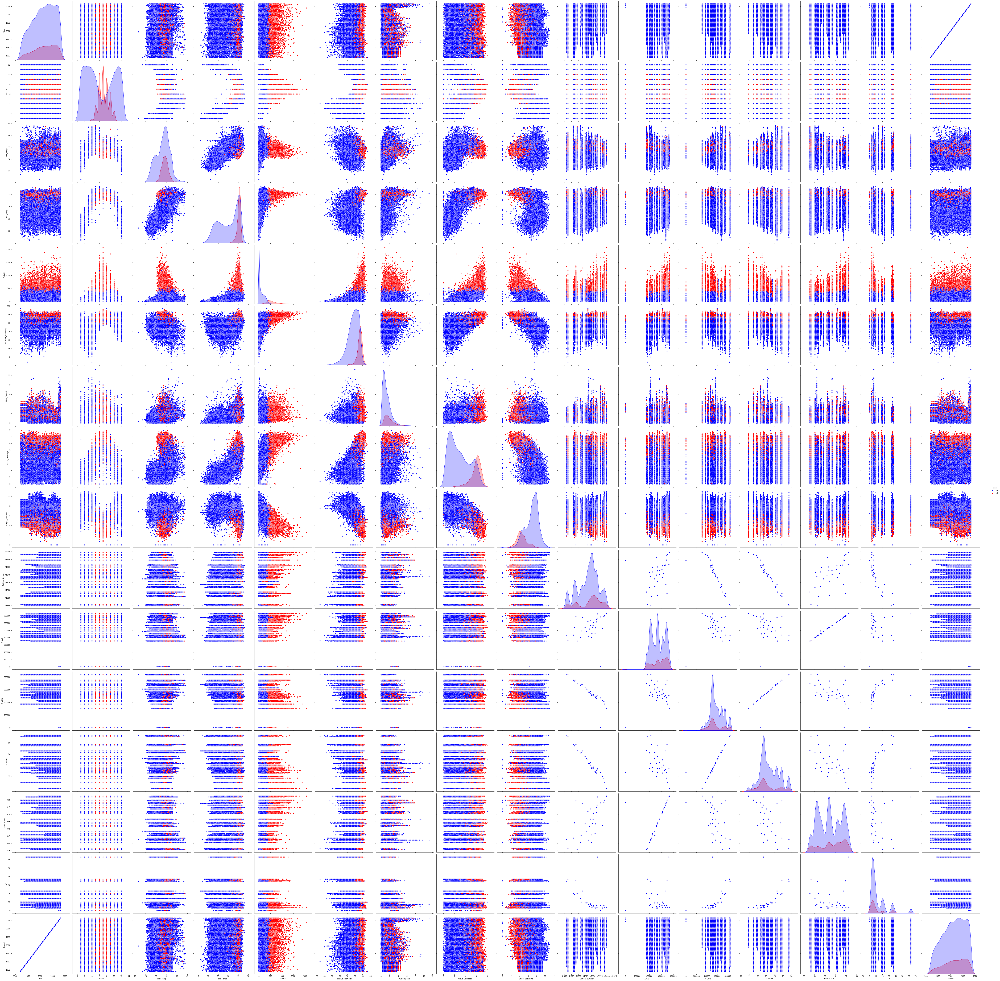

In [ ]:
colors = {0:'blue' , 1: 'red'}
sns.pairplot(df, size = 5, hue = 'Flood?', palette = colors)


In [42]:
#relation between each columns
df.corr()

,Year,Month,Max_Temp,Min_Temp,Rainfall,Relative_Humidity,Wind_Speed,Cloud_Coverage,Bright_Sunshine,Station_Number,X_COR,Y_COR,LATITUDE,LONGITUDE,ALT,Period,Flood?
Year,1.000000e+00,-5.258512e-16,0.086039,0.050232,0.030456,0.091602,0.044265,0.006604,-0.083561,1.089689e-01,3.488473e-02,-1.190950e-01,-1.121100e-01,5.307237e-02,-7.611529e-02,0.999998,0.028163
Month,-5.258512e-16,1.000000e+00,-0.066290,0.233238,0.131826,0.419630,-0.155175,0.168033,-0.210787,1.544839e-15,-6.647636e-16,-4.195910e-16,-3.514922e-16,-5.632437e-16,-1.939173e-15,0.001960,0.105497
Max_Temp,8.603896e-02,-6.629028e-02,1.000000,0.698850,0.256839,0.028561,0.308036,0.463159,-0.127182,-6.614433e-02,-1.278094e-01,5.536585e-02,5.799474e-02,-1.271222e-01,2.929211e-02,0.085909,0.135845
Min_Temp,5.023233e-02,2.332379e-01,0.698850,1.000000,0.595176,0.537773,0.383001,0.828193,-0.514024,1.245563e-01,4.184944e-02,-1.270355e-01,-1.291222e-01,4.506379e-02,-8.973014e-02,0.050689,0.412115
Rainfall,3.045589e-02,1.318256e-01,0.256839,0.595176,1.000000,0.591349,0.319636,0.765955,-0.676019,1.147305e-01,1.897868e-01,-1.055198e-01,-1.060542e-01,1.972219e-01,-1.499920e-02,0.030714,0.768816
Relative_Humidity,9.160159e-02,4.196296e-01,0.028561,0.537773,0.591349,1.000000,0.096067,0.659067,-0.665889,1.330401e-01,1.352264e-01,-1.222865e-01,-1.264260e-01,1.375900e-01,-8.484145e-02,0.092424,0.459099
Wind_Speed,4.426525e-02,-1.551754e-01,0.308036,0.383001,0.319636,0.096067,1.000000,0.388867,-0.174475,2.287799e-01,9.401606e-02,-2.246880e-01,-2.146820e-01,1.215455e-01,-1.448206e-01,0.043961,0.217529
Cloud_Coverage,6.604325e-03,1.680327e-01,0.463159,0.828193,0.765955,0.659067,0.388867,1.000000,-0.743366,2.875881e-02,6.032982e-02,-2.563907e-02,-2.563207e-02,6.318079e-02,2.804592e-03,0.006934,0.573665
Bright_Sunshine,-8.356127e-02,-2.107869e-01,-0.127182,-0.514024,-0.676019,-0.665889,-0.174475,-0.743366,1.000000,2.972534e-02,1.394002e-02,-3.101386e-02,-3.201442e-02,1.408221e-02,5.249082e-03,-0.083974,-0.551552
Station_Number,1.089689e-01,1.544839e-15,-0.066144,0.124556,0.114730,0.133040,0.228780,0.028759,0.029725,1.000000e+00,5.569808e-01,-9.743001e-01,-9.868368e-01,5.887549e-01,-5.205512e-01,0.108969,0.055361


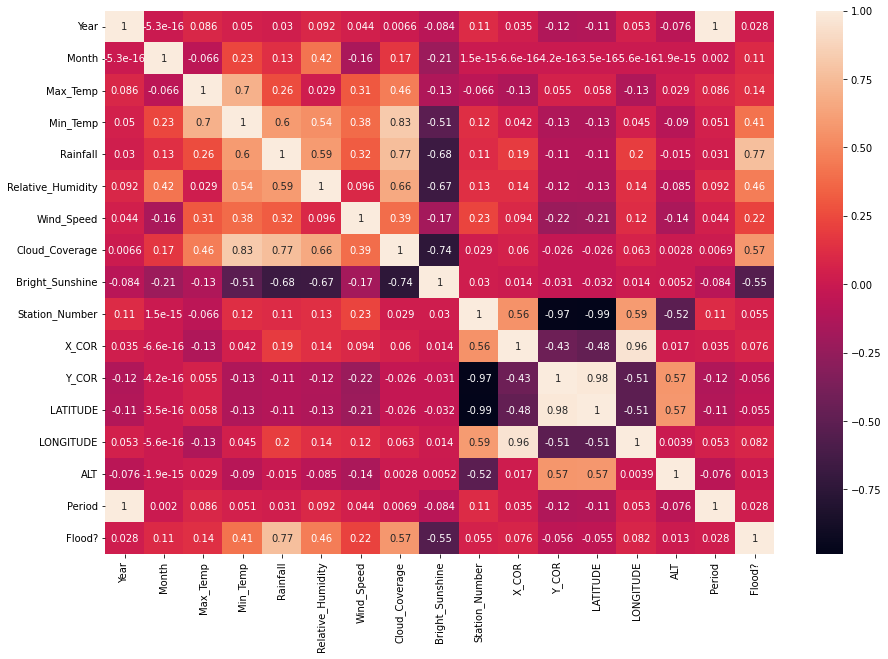

In [43]:
plt.figure(figsize = (15,10))
sns.heatmap(df.corr(), annot = True)

In [ ]:
df.columns

Index(['Station_Names', 'Year', 'Month', 'Max_Temp', 'Min_Temp', 'Rainfall',
       'Relative_Humidity', 'Wind_Speed', 'Cloud_Coverage', 'Bright_Sunshine',
       'Station_Number', 'X_COR', 'Y_COR', 'LATITUDE', 'LONGITUDE', 'ALT',
       'Period', 'Flood?'],
      dtype='object')

#Machine Learning Model

In [44]:
#Feature
X = df.iloc[:,[3,4,5,6,7,8,9,13,14,15]]
X

,Max_Temp,Min_Temp,Rainfall,Relative_Humidity,Wind_Speed,Cloud_Coverage,Bright_Sunshine,LATITUDE,LONGITUDE,ALT
0,29.4,12.3,0.0,68.0,0.453704,0.6,7.831915,22.70,90.36,4
1,33.9,15.2,9.0,63.0,0.659259,0.9,8.314894,22.70,90.36,4
2,36.7,20.2,8.0,59.0,1.085185,1.5,8.131915,22.70,90.36,4
3,33.9,23.9,140.0,71.0,1.772222,3.9,8.219149,22.70,90.36,4
4,35.6,25.0,217.0,76.0,1.703704,4.1,7.046809,22.70,90.36,4
...,...,...,...,...,...,...,...,...,...,...
20539,32.5,25.4,851.0,88.0,2.500000,6.2,3.800000,20.87,92.26,4
20540,32.6,25.7,329.0,88.0,3.000000,6.1,4.200000,20.87,92.26,4
20541,33.1,24.8,271.0,85.0,2.500000,4.4,5.600000,20.87,92.26,4
20542,32.5,20.0,0.0,79.0,2.100000,1.7,8.400000,20.87,92.26,4


In [45]:
#Detection and removal of outliers
for i in  X.columns:
  lower_limit = X[i].mean() - 3 * X[i].std()
  upper_limit = X[i].mean() + 3 * X[i].std()
  X = X[(X[i] < upper_limit) & (X[i] > lower_limit)]
X


,Max_Temp,Min_Temp,Rainfall,Relative_Humidity,Wind_Speed,Cloud_Coverage,Bright_Sunshine,LATITUDE,LONGITUDE,ALT
0,29.4,12.3,0.0,68.0,0.453704,0.6,7.831915,22.70,90.36,4
1,33.9,15.2,9.0,63.0,0.659259,0.9,8.314894,22.70,90.36,4
2,36.7,20.2,8.0,59.0,1.085185,1.5,8.131915,22.70,90.36,4
3,33.9,23.9,140.0,71.0,1.772222,3.9,8.219149,22.70,90.36,4
4,35.6,25.0,217.0,76.0,1.703704,4.1,7.046809,22.70,90.36,4
...,...,...,...,...,...,...,...,...,...,...
20539,32.5,25.4,851.0,88.0,2.500000,6.2,3.800000,20.87,92.26,4
20540,32.6,25.7,329.0,88.0,3.000000,6.1,4.200000,20.87,92.26,4
20541,33.1,24.8,271.0,85.0,2.500000,4.4,5.600000,20.87,92.26,4
20542,32.5,20.0,0.0,79.0,2.100000,1.7,8.400000,20.87,92.26,4


In [46]:
#target
Y = df.loc[X.index,:]['Flood?'].values
Y

array([0., 0., 0., ..., 0., 0., 0.])

In [47]:
X = X.values
X

array([[ 29.4 ,  12.3 ,   0.  , ...,  22.7 ,  90.36,   4.  ],
       [ 33.9 ,  15.2 ,   9.  , ...,  22.7 ,  90.36,   4.  ],
       [ 36.7 ,  20.2 ,   8.  , ...,  22.7 ,  90.36,   4.  ],
       ...,
       [ 33.1 ,  24.8 , 271.  , ...,  20.87,  92.26,   4.  ],
       [ 32.5 ,  20.  ,   0.  , ...,  20.87,  92.26,   4.  ],
       [ 29.9 ,  16.5 ,   0.  , ...,  20.87,  92.26,   4.  ]])

In [48]:
len(X) , len(Y)

(18933, 18933)

In [49]:
#Feature Scaling
scaler = StandardScaler()
X= scaler.fit_transform(X)
X

array([[-1.35156658, -1.75106199, -0.88442621, ..., -0.5753153 ,
        -0.05636758, -0.76164654],
       [ 0.18571852, -1.17213887, -0.8407257 , ..., -0.5753153 ,
        -0.05636758, -0.76164654],
       [ 1.14225148, -0.17399558, -0.84558131, ..., -0.5753153 ,
        -0.05636758, -0.76164654],
       ...,
       [-0.08757661,  0.74429625,  0.43144455, ..., -2.15991143,
         1.72604797, -0.76164654],
       [-0.29254795, -0.21392131, -0.88442621, ..., -2.15991143,
         1.72604797, -0.76164654],
       [-1.18075713, -0.91262162, -0.88442621, ..., -2.15991143,
         1.72604797, -0.76164654]])

In [50]:
#GridsearchCV - for finding the best model with suitable hyper parameters
model_param  = { 
    'svm' : {
        'model' : SVC(gamma  = 'auto'),
        'params' : {
          'C' : [1,10,20,30],
          'kernel' : ['linear', 'rbf'],
        }
    },
      'rfc' : {
          'model' : RandomForestClassifier(),
          'params' : {
              'n_estimators' :  [1,5,10,20,30,40],
          }
      },

      'lr' : {
          'model' : LogisticRegression(),
          'params' : {
              'C' : [1,5,10,20]
          }
      },

      'dc' : {
          'model' : DecisionTreeClassifier(),
          'params' : { 
              'criterion' : ['gini','entropy']
          }
      },
      'knn' : {
          'model' : KNeighborsClassifier(),
          'params' : {
              'n_neighbors' : [2,3,5,7]
          }
      }
}

In [51]:
model_param.items()

dict_items([('svm', {'model': SVC(gamma='auto'), 'params': {'C': [1, 10, 20, 30], 'kernel': ['linear', 'rbf']}}), ('rfc', {'model': RandomForestClassifier(), 'params': {'n_estimators': [1, 5, 10, 20, 30, 40]}}), ('lr', {'model': LogisticRegression(), 'params': {'C': [1, 5, 10, 20]}}), ('dc', {'model': DecisionTreeClassifier(), 'params': {'criterion': ['gini', 'entropy']}}), ('knn', {'model': KNeighborsClassifier(), 'params': {'n_neighbors': [2, 3, 5, 7]}})])

In [52]:
score = []
for m , par in model_param.items():
  clf = GridSearchCV(par['model'], par['params'], cv = 5, return_train_score = False)
  clf.fit(X,Y)
  score.append({
      'model' : par['model'],
      'best_score' :  clf.best_score_,
      'best_params' : clf.best_params_
  })

In [53]:
df1 = pd.DataFrame(score, columns = ['model','best_score','best_params'])
df1

,model,best_score,best_params
0,SVC(gamma='auto'),0.926953,"{'C': 1, 'kernel': 'rbf'}"
1,RandomForestClassifier(),0.932551,{'n_estimators': 40}
2,LogisticRegression(),0.927376,{'C': 1}
3,DecisionTreeClassifier(),0.918237,{'criterion': 'entropy'}
4,KNeighborsClassifier(),0.914857,{'n_neighbors': 7}


In [54]:
#Splitting into training and testing data
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.2)
len(X_train), len(Y_test)

(15146, 3787)

In [55]:
mod = RandomForestClassifier(n_estimators = 40)
mod.fit(X_train, Y_train)
mod.score(X_test, Y_test)

0.9701610773699498

In [56]:
#Predicted values
Y_pred = mod.predict(X_test)
Y_pred

array([0., 0., 0., ..., 1., 0., 0.])

#Analysing Model Performance

In [57]:
accuracy_score(Y_test,Y_pred)

0.9701610773699498

In [58]:
cm  = confusion_matrix(Y_test, Y_pred)
cm

array([[3051,   44],
       [  69,  623]])

Text(0.5, 1.0, 'Confusion matrix')

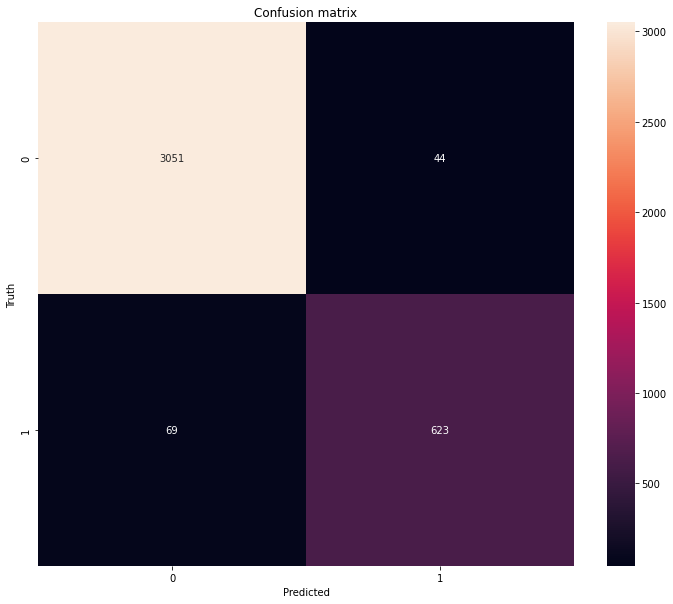

In [60]:
plt.figure(figsize = (12,10))
sns.heatmap(cm, annot = True, fmt = 'd')
plt.xlabel('Predicted')
plt.ylabel('Truth')
plt.title('Confusion matrix')

In [64]:
print(classification_report(Y_test, Y_pred))

              precision    recall  f1-score   support

         0.0       0.98      0.99      0.98      3095
         1.0       0.93      0.90      0.92       692

    accuracy                           0.97      3787
   macro avg       0.96      0.94      0.95      3787
weighted avg       0.97      0.97      0.97      3787



f1 score = 2(precision * recall) / (precision + recall)

#Checking The Model

In [ ]:
mod.predict([[ 0.04907096,  0.92396205,  0.81018226,  0.89379254, -0.00832943,
        1.0520116 , -1.28166466, -0.5753153 , -0.05636758, -0.76164654]])

array([1.])

In [ ]:
mod.predict([[ 0.93728013,  0.88403632, -0.46198799, -0.23294891,  0.40825818,
        0.66488969,  0.34386546, -0.5753153 , -0.05636758, -0.76164654]])

array([1.])

In [ ]:
mod.predict([[-1.14659524, -1.3917304 , -0.88442621, -0.37379159, -0.9838044 ,
       -1.27071987,  0.8038506 , -0.5753153 , -0.05636758, -0.76164654]])

array([0.])

In [ ]:
mod.predict([[-0.39503363,  0.96388778,  1.76673776,  1.31632058,  0.25977151,
        1.63269446, -1.59455428, -0.5753153 , -0.05636758, -0.76164654]])

array([1.])

In [ ]:
mod.predict([[-0.19006228, -0.5732529 , -0.77760275,  0.04873645, -1.15497654,
       -0.73842724,  1.48821872, -0.5753153 , -0.05636758, -0.76164654]])

array([0.])